In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm

In [3]:
mfg_data = pd.read_csv('..\data\manufacturing_6G_dataset.csv')

In [4]:
mfg_data.head()

,Timestamp,Machine_ID,Operation_Mode,Temperature_C,Vibration_Hz,Power_Consumption_kW,Network_Latency_ms,Packet_Loss_%,Quality_Control_Defect_Rate_%,Production_Speed_units_per_hr,Predictive_Maintenance_Score,Error_Rate_%,Efficiency_Status
0,2024-01-01 00:00:00,39,Idle,74.137590,3.500595,8.612162,10.650542,0.207764,7.751261,477.657391,0.344650,14.965470,Low
1,2024-01-01 00:01:00,29,Active,84.264558,3.355928,2.268559,29.111810,2.228464,4.989172,398.174747,0.769848,7.678270,Low
2,2024-01-01 00:02:00,15,Active,44.280102,2.079766,6.144105,18.357292,1.639416,0.456816,108.074959,0.987086,8.198391,Low
3,2024-01-01 00:03:00,43,Active,40.568502,0.298238,4.067825,29.153629,1.161021,4.582974,329.579410,0.983390,2.740847,Medium
4,2024-01-01 00:04:00,8,Idle,75.063817,0.345810,6.225737,34.029191,4.796520,2.287716,159.113525,0.573117,12.100686,Low


In [5]:
# Setting right feature type
mfg_data['Timestamp'] = pd.to_datetime(mfg_data['Timestamp'])
mfg_data['Machine_ID'] = mfg_data['Machine_ID'].astype('object')

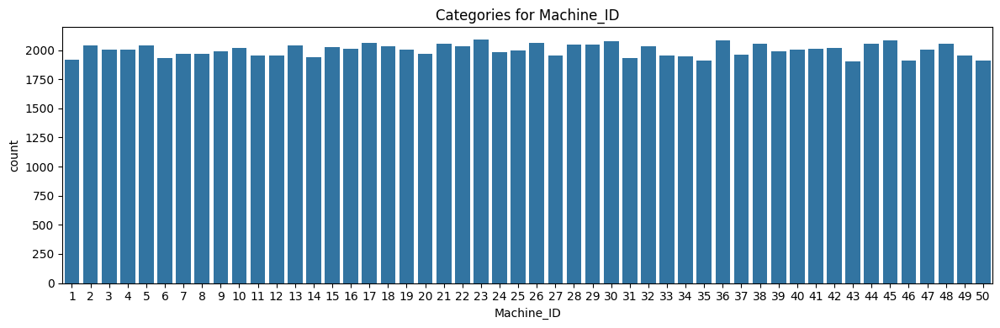

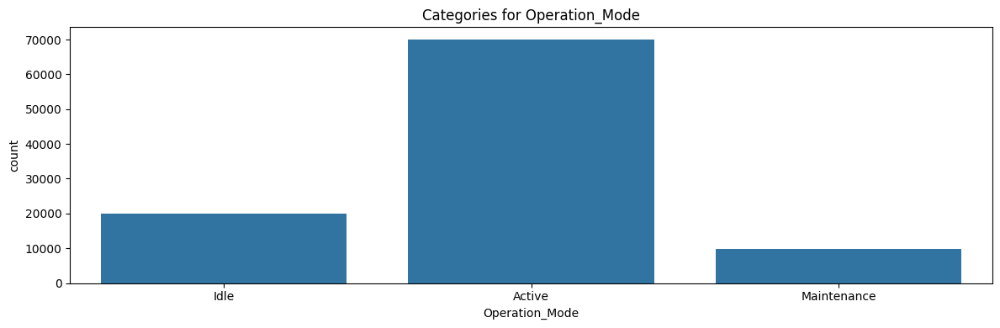

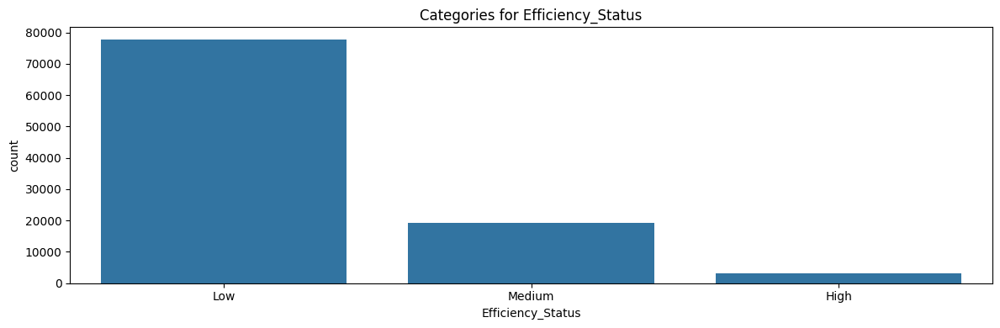

{'Machine_ID': 50, 'Operation_Mode': 3, 'Efficiency_Status': 3}


In [6]:
#Find Categorical Features on childcare_costs dataset
def cat_features_explore(df):
    def calc_unique_counts(df,col_name):
        col = df[col_name]
        unique_val = col.unique()
        plt.figure(figsize=(12,4))
        sns.countplot(data=df, x=col_name)
        plt.title(f'Categories for {col_name}')
        plt.tight_layout()
        plt.show()
        return len(unique_val)

    cat_cols = mfg_data.select_dtypes(include="object").columns.to_list()
    count_dic = {col:calc_unique_counts(mfg_data,col) for col in cat_cols}
    print(count_dic)    
 
cat_features_explore(mfg_data)



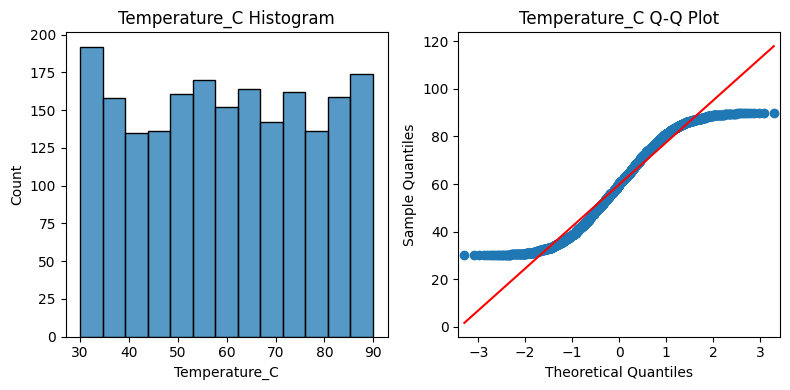

Temperature_C Mean: 59.81
Temperature_C Median: 59.98
Temperature_C Max: 89.94
Temperature_C Min: 30.03
Temperature_C Standard Deviation: 17.64
Temperature_C Number of Points: 2041


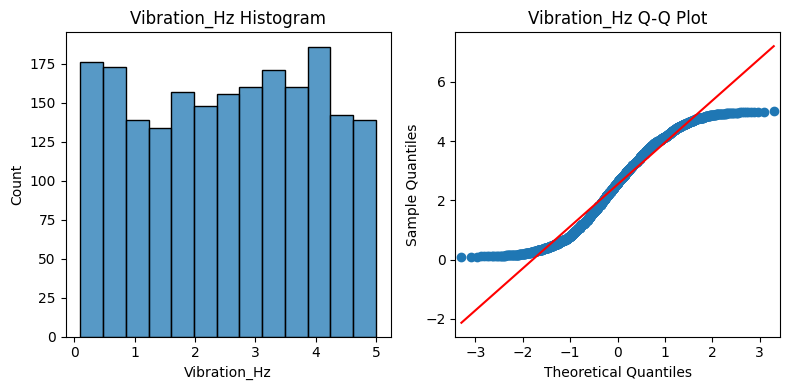

Vibration_Hz Mean: 2.53
Vibration_Hz Median: 2.59
Vibration_Hz Max: 5.00
Vibration_Hz Min: 0.10
Vibration_Hz Standard Deviation: 1.42
Vibration_Hz Number of Points: 2041


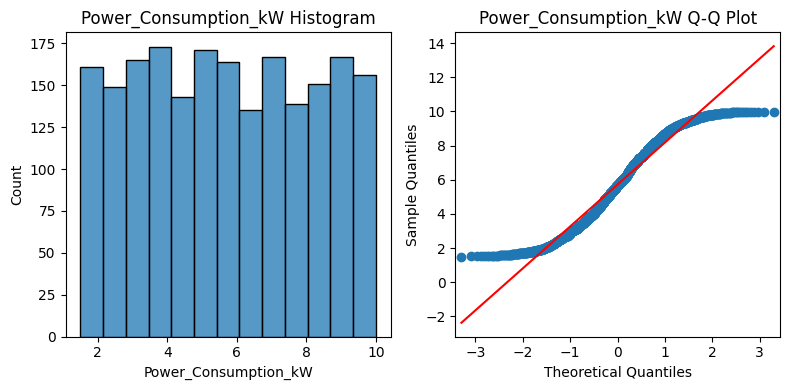

Power_Consumption_kW Mean: 5.72
Power_Consumption_kW Median: 5.68
Power_Consumption_kW Max: 10.00
Power_Consumption_kW Min: 1.50
Power_Consumption_kW Standard Deviation: 2.46
Power_Consumption_kW Number of Points: 2041


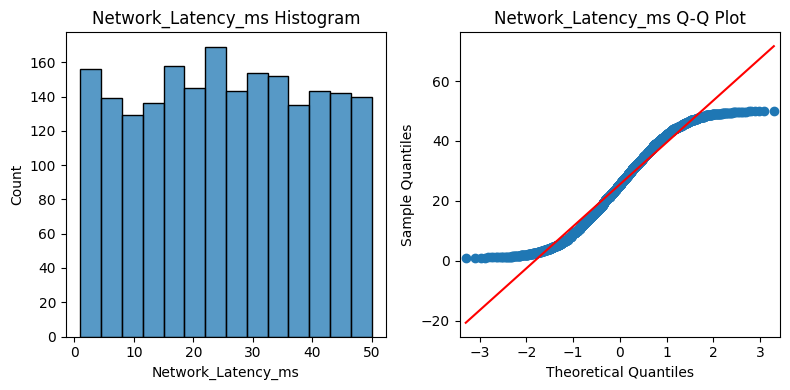

Network_Latency_ms Mean: 25.45
Network_Latency_ms Median: 25.34
Network_Latency_ms Max: 49.98
Network_Latency_ms Min: 1.02
Network_Latency_ms Standard Deviation: 14.02
Network_Latency_ms Number of Points: 2041


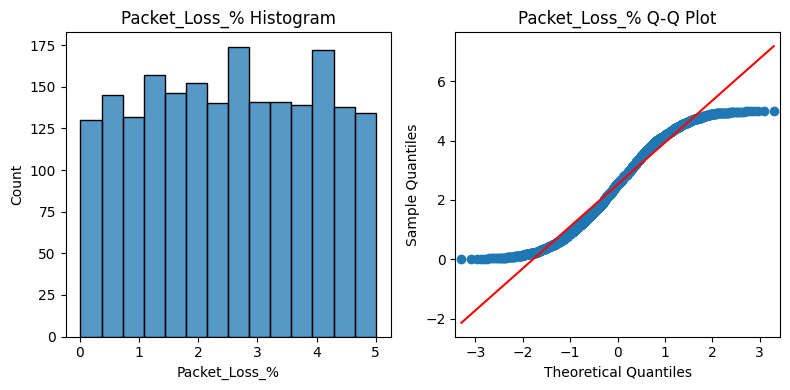

Packet_Loss_% Mean: 2.52
Packet_Loss_% Median: 2.56
Packet_Loss_% Max: 5.00
Packet_Loss_% Min: 0.01
Packet_Loss_% Standard Deviation: 1.41
Packet_Loss_% Number of Points: 2041


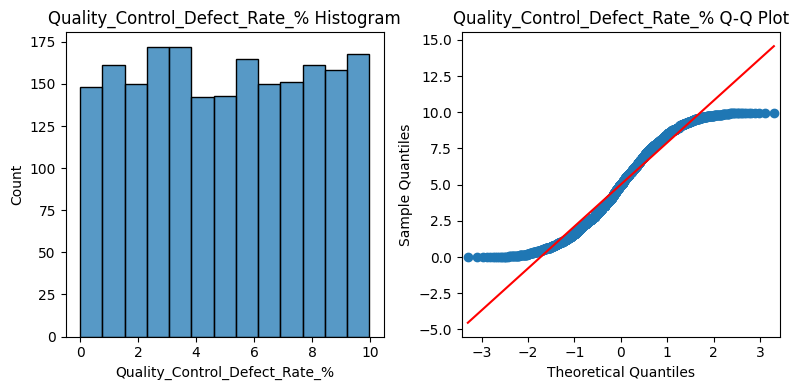

Quality_Control_Defect_Rate_% Mean: 5.01
Quality_Control_Defect_Rate_% Median: 5.00
Quality_Control_Defect_Rate_% Max: 9.98
Quality_Control_Defect_Rate_% Min: 0.00
Quality_Control_Defect_Rate_% Standard Deviation: 2.90
Quality_Control_Defect_Rate_% Number of Points: 2041


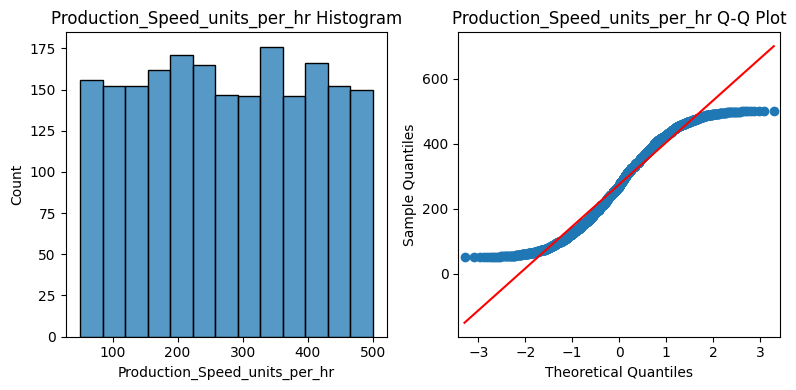

Production_Speed_units_per_hr Mean: 274.51
Production_Speed_units_per_hr Median: 270.07
Production_Speed_units_per_hr Max: 499.98
Production_Speed_units_per_hr Min: 50.35
Production_Speed_units_per_hr Standard Deviation: 129.23
Production_Speed_units_per_hr Number of Points: 2041


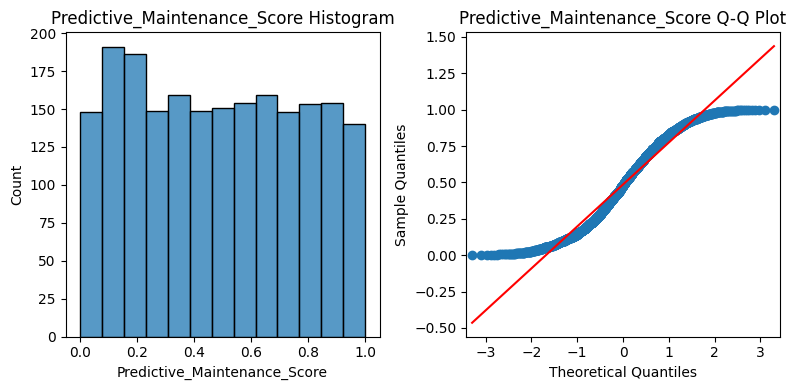

Predictive_Maintenance_Score Mean: 0.49
Predictive_Maintenance_Score Median: 0.48
Predictive_Maintenance_Score Max: 1.00
Predictive_Maintenance_Score Min: 0.00
Predictive_Maintenance_Score Standard Deviation: 0.29
Predictive_Maintenance_Score Number of Points: 2041


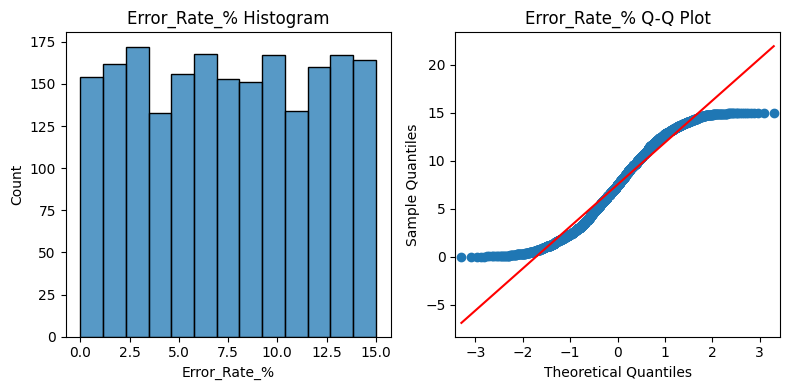

Error_Rate_% Mean: 7.52
Error_Rate_% Median: 7.48
Error_Rate_% Max: 15.00
Error_Rate_% Min: 0.00
Error_Rate_% Standard Deviation: 4.38
Error_Rate_% Number of Points: 2041


In [7]:
def plot_hist_qq(df,col_name):
    col = df[col_name]

    fig, (ax1, ax2) = plt.subplots(ncols=2,nrows=1,figsize=(8, 4))
    sns.histplot(col, linewidth=1,ax=ax1)
    #sns.kdeplot(col, linewidth=5,ax=ax1)
    ax1.set_title(col_name + ' Histogram')

    sm.qqplot(col,line='s',ax=ax2)
    ax2.set_title(col_name + ' Q-Q Plot')
    plt.tight_layout()
    plt.show()

def calculate_stats(df,col_name):
    print (f"{col_name} Mean: {df[col_name].mean():.2f}")
    print (f"{col_name} Median: {df[col_name].median():.2f}")
    print (f"{col_name} Max: {df[col_name].max():.2f}")
    print (f"{col_name} Min: {df[col_name].min():.2f}")
    print (f"{col_name} Standard Deviation: {df[col_name].std():.2f}")    
    print (f"{col_name} Number of Points: {len(df[col_name]):.0f}")    

for col in mfg_data.select_dtypes(include="number").columns.to_list():
    plot_hist_qq(mfg_data[mfg_data['Machine_ID']==2],col) 
    calculate_stats(mfg_data[mfg_data['Machine_ID']==2],col)

<Figure size 1000x600 with 0 Axes>

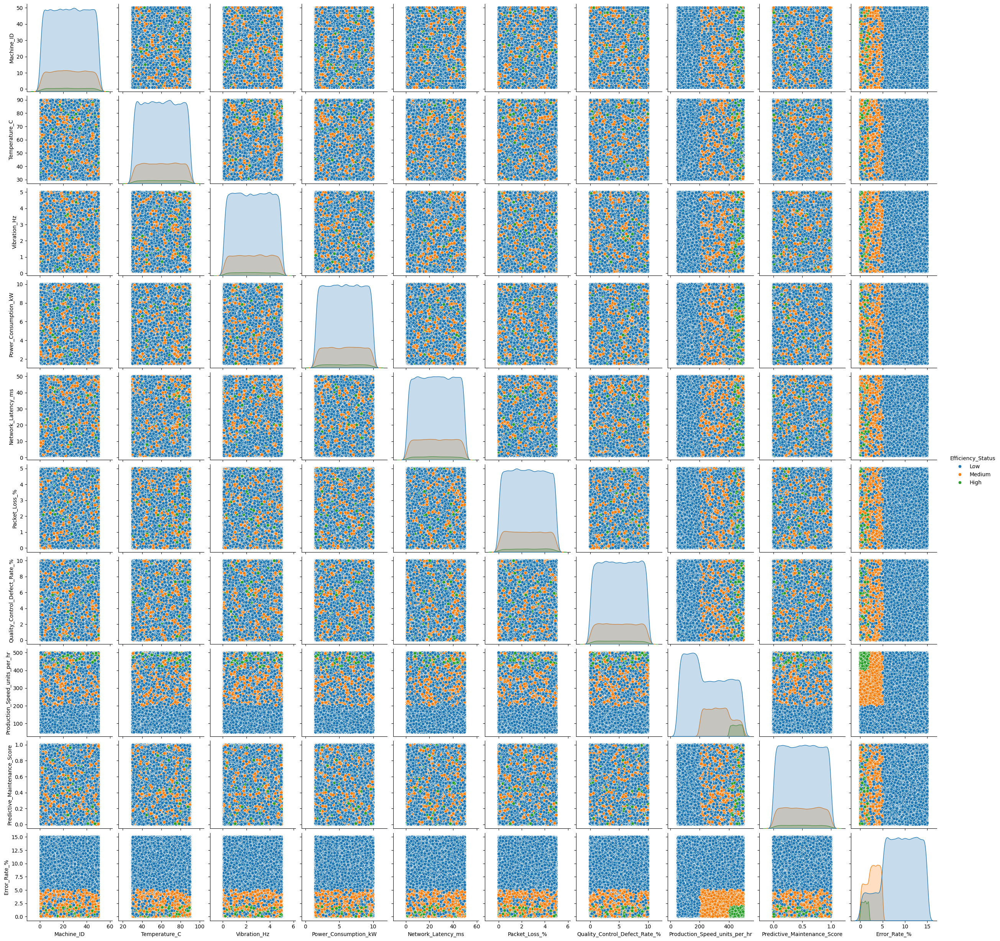

In [8]:
mfg_data.select_dtypes(include="number").columns.to_list()
plt.figure(figsize=(10,6))
sns.pairplot(mfg_data, diag_kind='kde',hue='Efficiency_Status')
plt.show()

# DATA PREPARATION FOR ANOMALY DETECTION

In [42]:
mfg_data_2 = mfg_data.groupby(['Machine_ID',mfg_data["Timestamp"].dt.date]).mean(numeric_only=True).reset_index()
mfg_data_2['Machine_ID'] = mfg_data_2['Machine_ID'].astype('object')
mfg_data_2['Timestamp'] = pd.to_datetime(mfg_data_2['Timestamp'])

mfg_data_2.head()


,Machine_ID,Timestamp,Temperature_C,Vibration_Hz,Power_Consumption_kW,Network_Latency_ms,Packet_Loss_%,Quality_Control_Defect_Rate_%,Production_Speed_units_per_hr,Predictive_Maintenance_Score,Error_Rate_%
0,1,2024-01-01,61.611040,2.610587,5.869368,27.272905,2.361617,5.045644,334.572071,0.401736,7.254418
1,1,2024-01-02,55.194740,2.411919,5.883822,29.543064,2.573108,5.940892,321.765835,0.463723,6.200328
2,1,2024-01-03,56.949989,2.411682,5.724331,29.983094,2.700738,5.289382,299.529689,0.413455,7.714974
3,1,2024-01-04,59.178205,3.062527,6.043511,28.034322,1.985974,4.925408,258.376800,0.600241,6.451960
4,1,2024-01-05,68.445868,2.241314,5.587359,25.700449,2.388666,5.579490,288.978882,0.494236,6.249593


<Figure size 1000x600 with 0 Axes>

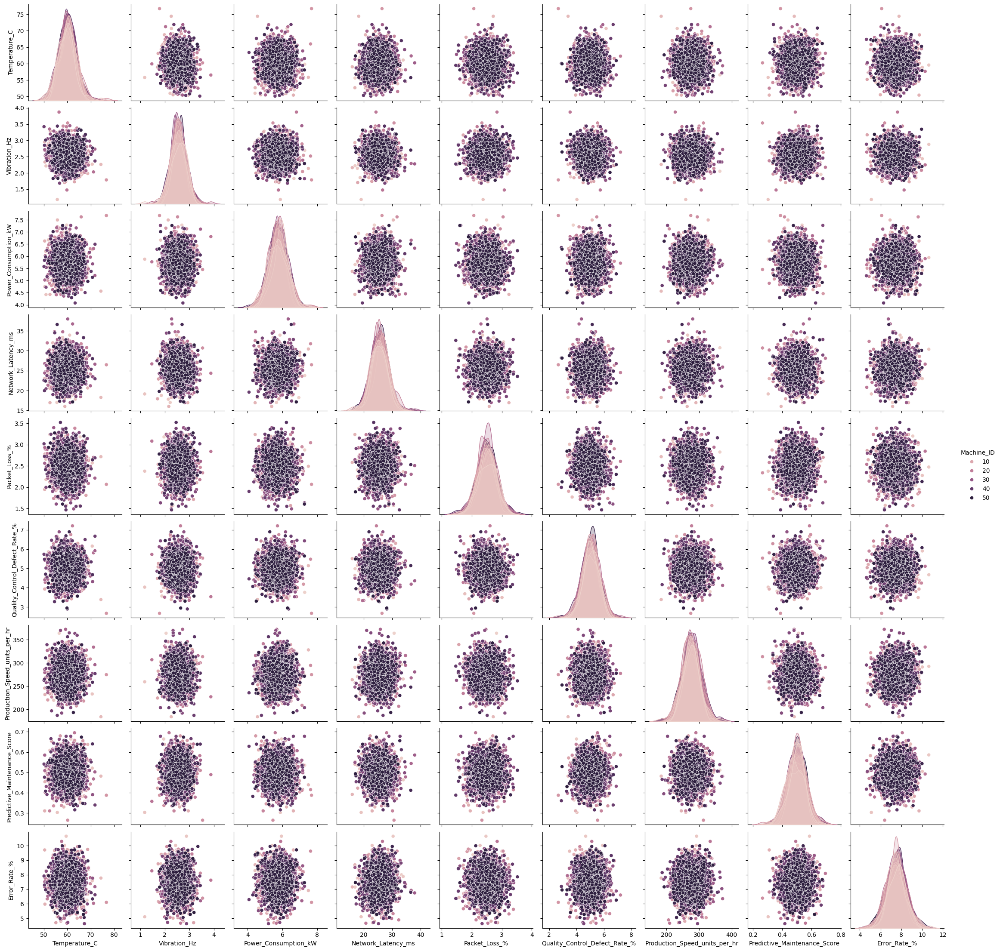

In [40]:
mfg_data_2.select_dtypes(include="number").columns.to_list()
plt.figure(figsize=(10,6))
sns.pairplot(mfg_data_2, diag_kind='kde',hue='Machine_ID')
plt.show()

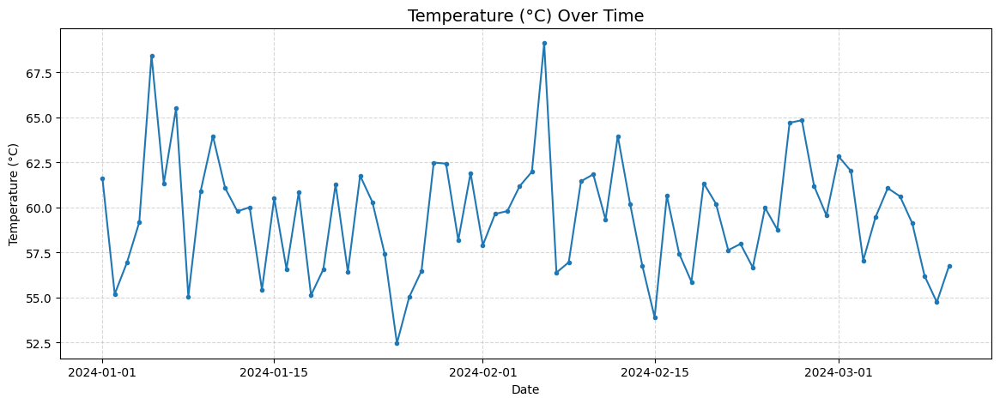

In [45]:
machine_1 =mfg_data_2[mfg_data_2['Machine_ID']==1] 

start_date = "2024-01-01"
end_date = "2024-12-30"
tred_plot_df = machine_1[(machine_1["Timestamp"] >= start_date) & (machine_1["Timestamp"] <= end_date)]

plt.figure(figsize=(14, 5))
plt.plot(tred_plot_df["Timestamp"], tred_plot_df["Temperature_C"], marker="o", markersize=3, linestyle="-")

plt.title("Temperature (°C) Over Time", fontsize=14)
plt.xlabel("Date")
plt.ylabel("Temperature (°C)")
plt.grid(True, linestyle="--", alpha=0.5)

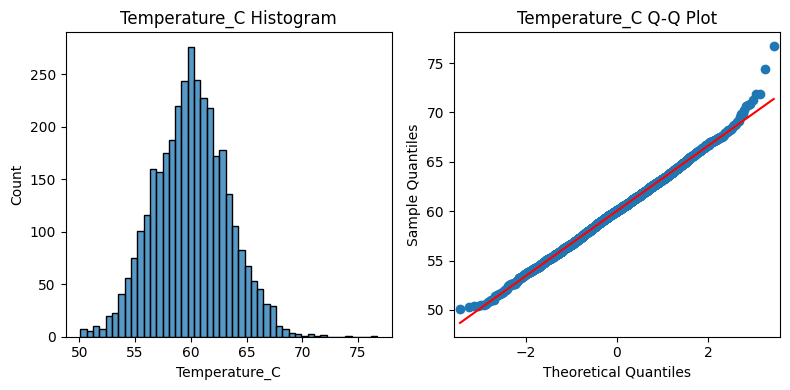

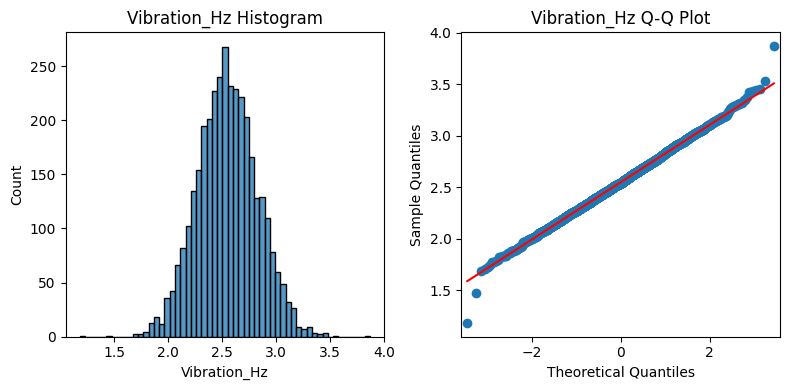

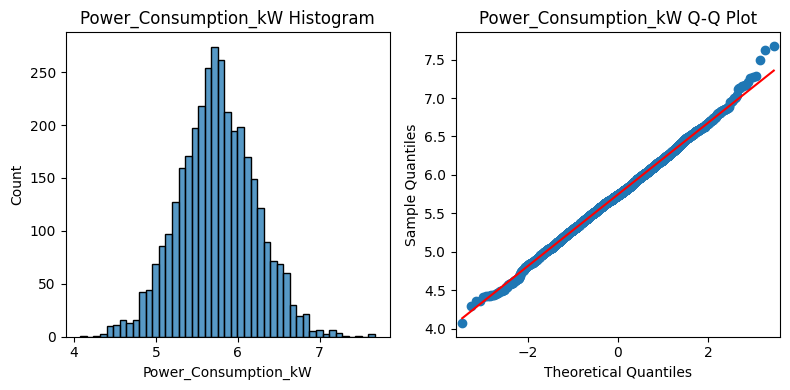

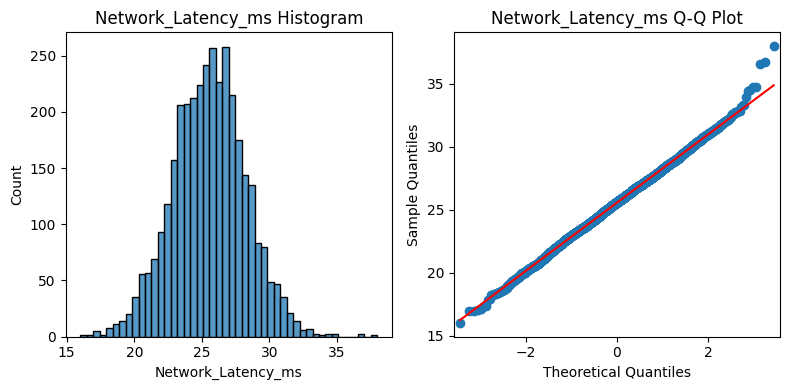

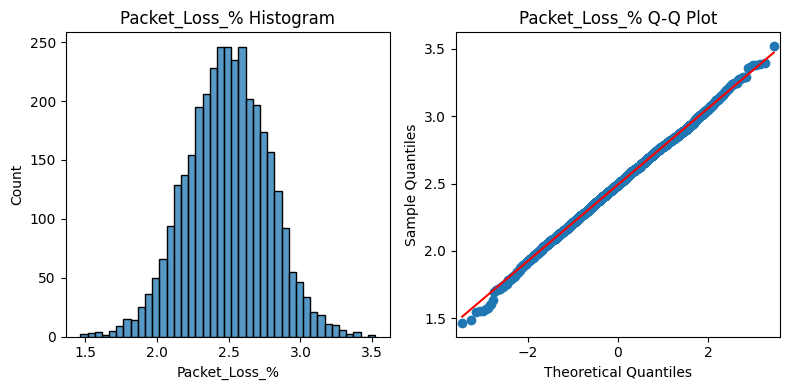

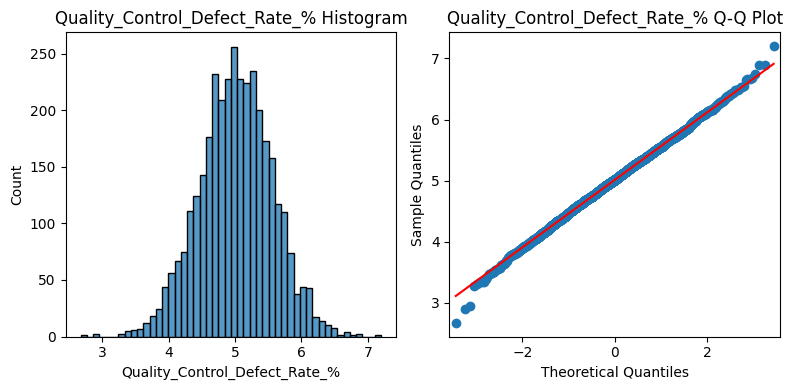

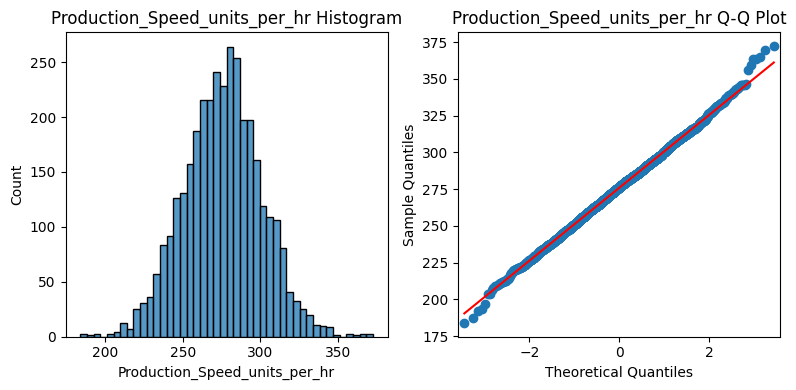

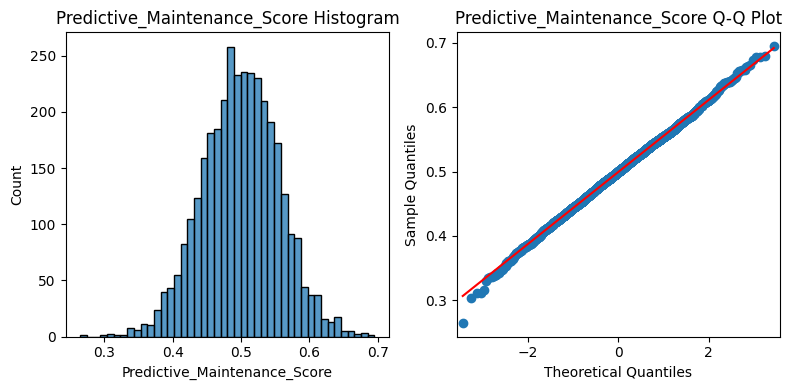

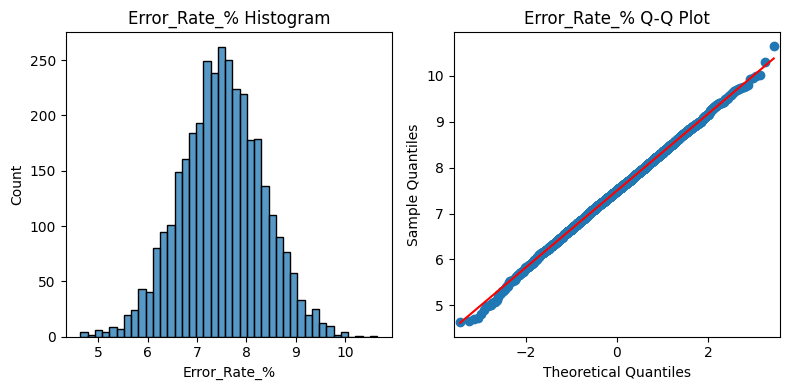

In [46]:
for col in mfg_data_2.select_dtypes(include="number").columns.to_list():
    plot_hist_qq(mfg_data_2,col) 


In [47]:
#Outliers Overview
def report_quantity_outliers(df):
    for col in df.columns:
        q25 = df[col].quantile(0.25)
        q75 = df[col].quantile(0.75)
        iqr = q75 - q25
        lower_bound = q25 - 1.5 * iqr
        upper_bound = q75 + 1.5 * iqr
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        print(f"{col}: {outliers.shape[0]} outliers")

num_cols = mfg_data_2.select_dtypes(include="number").columns.to_list()        

report_quantity_outliers(mfg_data_2[num_cols])

Temperature_C: 30 outliers
Vibration_Hz: 27 outliers
Power_Consumption_kW: 43 outliers
Network_Latency_ms: 26 outliers
Packet_Loss_%: 28 outliers
Quality_Control_Defect_Rate_%: 39 outliers
Production_Speed_units_per_hr: 31 outliers
Predictive_Maintenance_Score: 33 outliers
Error_Rate_%: 29 outliers


In [48]:
mfg_data_2.to_csv('..\data\processed\mfg_time_series.csv',index=False)